In [13]:
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import os
import sys
import re
import pandas as pd 
import glob
import scipy
import scipy.io
from collections import Counter
import scanpy as sc
import gseapy as gp
import h5py
import louvain
import harmonypy as hm
import scrublet as scr
from matplotlib import rcParams
rcParams['figure.figsize'] = 12,12
file_figs = ''
from methods import *
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)
sc.settings.figdir = '../figures/ec_subtypes/'

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
appdirs             1.4.4
attr                20.2.0
backcall            0.2.0
bioservices         1.6.0
brotli              NA
bs4                 4.9.1
cairo               1.19.1
certifi             2020.06.20
cffi                1.14.0
chardet             3.0.4
colorama            0.4.3
colorlog            NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
docutils            0.16
easydev             0.10.1
get_version         2.1
gseapy              0.10.1
h5py                2.10.0
harmonypy           NA
html5lib            1.1
idna                2.10
igraph              0.8.2
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              0.16.0
jsonschema          3.2.0
kiwisolver          1.2.0
legacy_api_wrap     1.2
lei

In [14]:
rcParams['font.family'] = 'Arial'

-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
appdirs             1.4.4
attr                20.2.0
backcall            0.2.0
bioservices         1.6.0
brotli              NA
bs4                 4.9.1
cairo               1.19.1
certifi             2020.06.20
cffi                1.14.0
chardet             3.0.4
colorama            0.4.3
colorlog            NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
docutils            0.16
easydev             0.10.1
get_version         2.1
gseapy              0.10.1
h5py                2.10.0
harmonypy           NA
html5lib            1.1
idna                2.10
igraph              0.8.2
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              0.16.0
jsonschema          3.2.0
kiwisolver          1.2.0
legacy_api_wrap     1.2
lei

/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


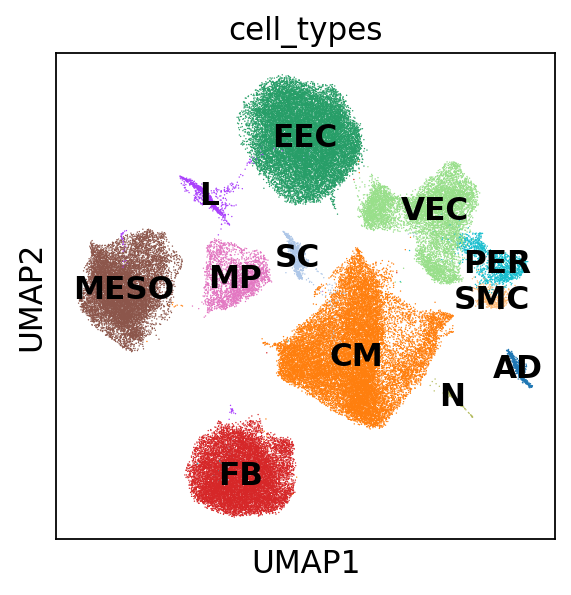

In [15]:
%matplotlib inline
from matplotlib import rcParams
rcParams['figure.figsize'] = 12,12
file_figs = ''
from methods import *
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)
sc.settings.figdir = '../figures/M2_cell_type/'

adata = sc.read_h5ad("../h5ad/celltypes_60_6000_500_0.1.h5ad")
print(adata)
sc.pl.umap(adata, color = 'cell_types', legend_loc = 'on data')

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    558 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    602 total control genes are used. (0:00:02)
-->     'phase', cell cycle phase (adata.obs)


... storing 'phase' as categorical
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


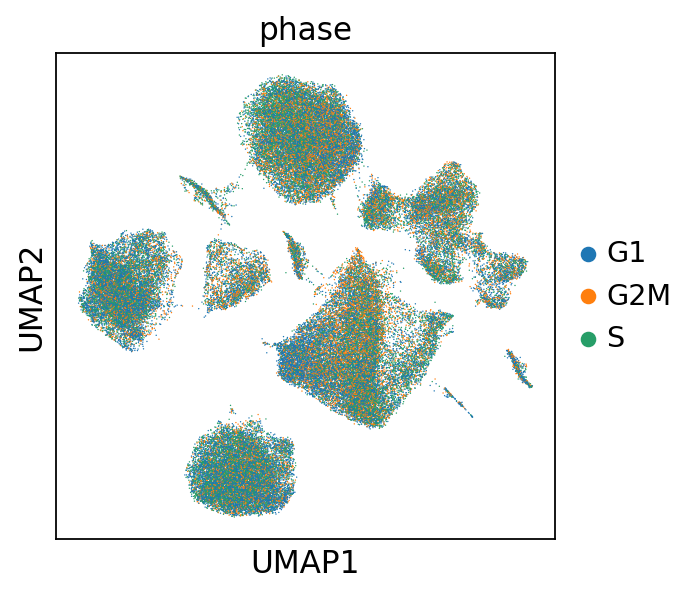

In [7]:
cell_cycle_genes = [x.strip() for x in open('../data/regev_lab_cell_cycle_genes.txt')]

s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

adata.obs.phase.value_counts()

sc.pl.umap(adata, color = 'phase')

In [17]:
adata.obs

,n_genes,percent_mito,n_counts,doublet_score,batch,sample_id,phenotype,leiden,cell_types,S_score,G2M_score,phase
cell_1_13-0,1110,0.099585,1687.0,0.070015,1,1,CAD,4,CM,0.059872,-0.030990,S
cell_1_14-0,995,0.102985,1340.0,0.072449,1,1,CAD,0,FB,-0.052022,-0.015906,G1
cell_1_15-0,1135,0.094244,1581.0,0.030474,1,1,CAD,0,FB,0.137471,0.073805,S
cell_1_16-0,1179,0.064593,1672.0,0.021225,1,1,CAD,0,FB,-0.042898,-0.048418,G1
cell_1_26-0,1037,0.077736,1608.0,0.083453,1,1,CAD,3,CM,-0.029453,0.021337,G2M
...,...,...,...,...,...,...,...,...,...,...,...,...
cell_174_10086-12,2050,0.143857,4143.0,0.041025,3,174,HF_Congestive,4,CM,0.009659,-0.023706,S
cell_174_10087-12,3274,0.079461,7790.0,0.054911,3,174,HF_Congestive,2,MESO,-0.016740,-0.022008,G1
cell_174_10089-12,2118,0.011379,3779.0,0.028820,3,174,HF_Congestive,2,MESO,-0.052003,-0.024523,G1
cell_174_10092-12,2405,0.062819,4314.0,0.028820,3,174,HF_Congestive,1,EEC,0.009158,0.063907,G2M


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 9662 × 10635
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'PCA_corr', 'PCA_cos', 'batch_colors', 'cell_types_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'phase_colors', 'phenotype_colors', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


Trying to set attribute `.var` of view, copying.


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)
AnnData object with n_obs × n_vars = 9662 × 10635
    obs: 'n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'sample_id', 'phenotype', 'leiden', 'cell_types', 'S_score', 'G2M_score', 'phase', 'old_leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'rps', 'rpl', 'mt', 'cm'
    uns: 'PCA_corr', 'PCA_cos', 'batch_colors', 'cell_types_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'phase_colors', 'phenotype_colors', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_

2020-10-02 09:40:50,900 - harmonypy - INFO - Iteration 1 of 10
2020-10-02 09:40:56,806 - harmonypy - INFO - Iteration 2 of 10
2020-10-02 09:41:02,614 - harmonypy - INFO - Iteration 3 of 10
2020-10-02 09:41:04,995 - harmonypy - INFO - Iteration 4 of 10
2020-10-02 09:41:06,399 - harmonypy - INFO - Iteration 5 of 10
2020-10-02 09:41:07,466 - harmonypy - INFO - Iteration 6 of 10
2020-10-02 09:41:08,540 - harmonypy - INFO - Iteration 7 of 10
2020-10-02 09:41:09,498 - harmonypy - INFO - Iteration 8 of 10
2020-10-02 09:41:10,350 - harmonypy - INFO - Iteration 9 of 10
2020-10-02 09:41:11,200 - harmonypy - INFO - Converged after 9 iterations


computing neighbors
    using 'X_pca' with n_pcs = 40


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 6103. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/home/schmauch/data/conda/envs/project3/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


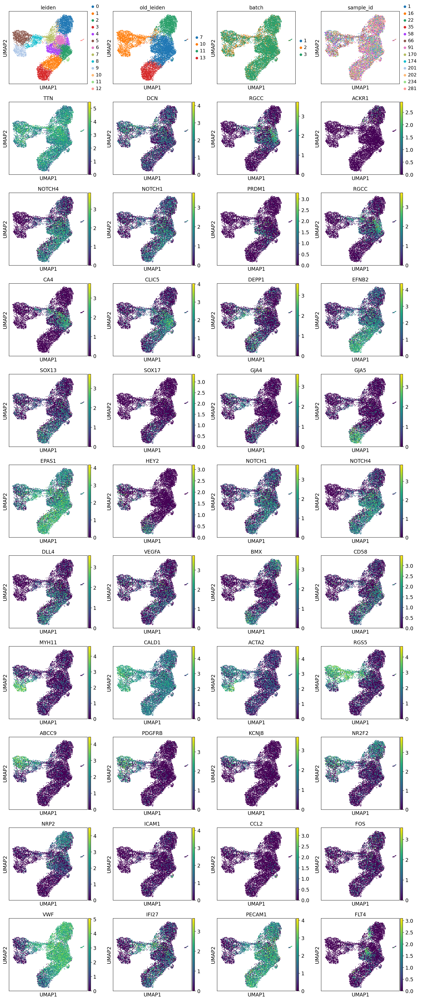

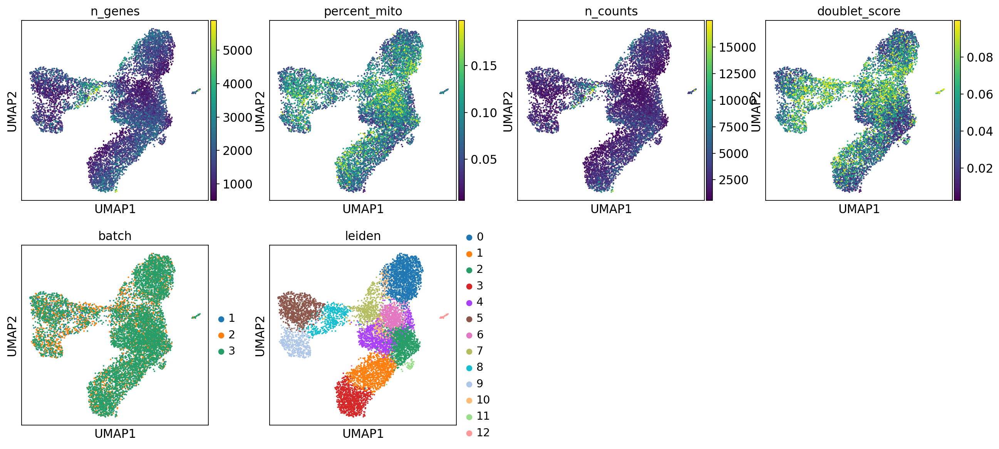

In [5]:
adata.obs['old_leiden'] = adata.obs.leiden
subadata = adata[adata.obs.cell_types.isin(['VEC', 'SMC', 'PER'])]
#subraw = sc.AnnData(subadata.raw.X.toarray(), var = subadata.raw.var, obs = subadata.obs)
#print(subraw)
#sc.pp.highly_variable_genes(subraw, min_mean=0.005, max_mean=5, min_disp=-0.25)
rcParams['figure.figsize'] = 5,5
#sc.pl.highly_variable_genes(subraw)
#subraw.raw = subraw
#subraw = subraw[:, subraw.var.highly_variable]
#print(subraw)
#subadata = subraw
print(subadata)

subadata.var['rps'] = subadata.var_names.str.startswith('RPS')
subadata.var['rpl'] = subadata.var_names.str.startswith('RPL')
subadata.var['mt'] = subadata.var_names.str.startswith('MT-')
sc.tl.rank_genes_groups(adata, 'cell_types', method='t-test', n_genes = 1000)
df = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(1000)
#print(list(df.loc[0:500, 'CM']))
subadata.var['cm'] = subadata.var_names.isin(list(df.loc[0:999, 'CM']))

#subadata = subadata[:,~(subadata.var['cm'] | subadata.var['rps'] | subadata.var['rpl'] | subadata.var['mt'])]
#subadata = subadata[:,subadata.var.index.isin(subraw.var.index)]
print(subadata)
#sc.pp.regress_out(subadata, ['n_counts', 'percent_mito'])
#sc.pp.scale(subadata, max_value=10)
sc.tl.pca(subadata, svd_solver='arpack')
ho = hm.run_harmony(subadata.obsm['X_pca'], subadata.obs, "sample_id", max_iter_kmeans=50)
subadata.obsm['X_pca'] = ho.Z_corr.T
sc.pp.neighbors(subadata, n_neighbors=10, n_pcs=40)
sc.tl.umap(subadata)
sc.tl.leiden(subadata, resolution = 1)
rcParams['figure.figsize'] = 4,4
sc.pl.umap(subadata, color=['leiden', 'old_leiden', 'batch', 'sample_id', 'TTN', 'DCN', 'RGCC', 'ACKR1', 
               'NOTCH4', 'NOTCH1', 'PRDM1',
               'RGCC', 'CA4', 'CLIC5',
               "DEPP1", "EFNB2", "SOX13", "SOX17", "GJA4", "GJA5", "EPAS1", "HEY2", "NOTCH1"
                         ,"NOTCH4", "DLL4", "VEGFA", "BMX", "CD58",
               "MYH11", "CALD1", "ACTA2", 
               "RGS5", "ABCC9", "PDGFRB", "KCNJ8",
               'NR2F2', 'NRP2', 'ICAM1', 'CCL2', 'FOS',
              "VWF", "IFI27", "PECAM1", 'FLT4'])
sc.pl.umap(subadata, color = ['n_genes', 'percent_mito', 'n_counts', 'doublet_score', 'batch', 'leiden'])

In [12]:
subadata.obs.leiden.value_counts()

0     1687
1     1254
2     1197
4      992
3      992
5      991
6      725
7      561
8      475
9      457
10     243
11      59
12      29
Name: leiden, dtype: int64

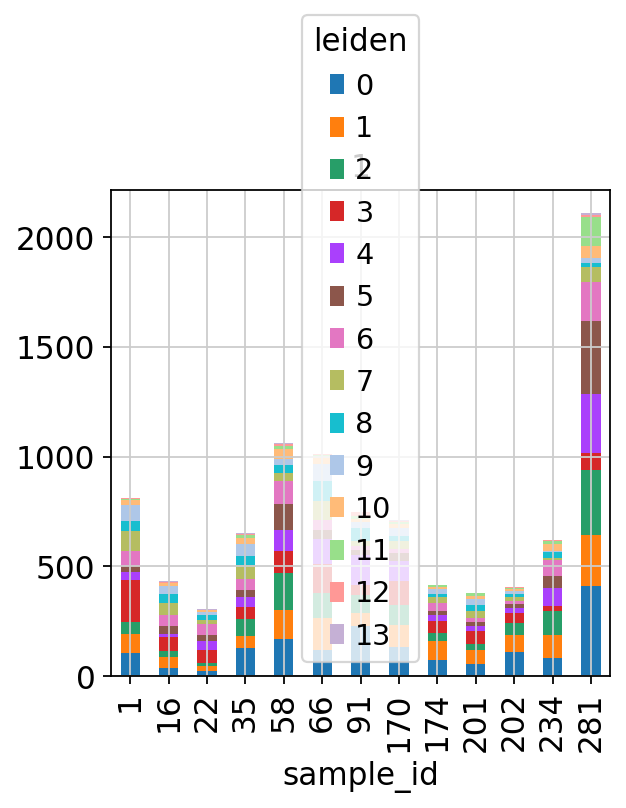

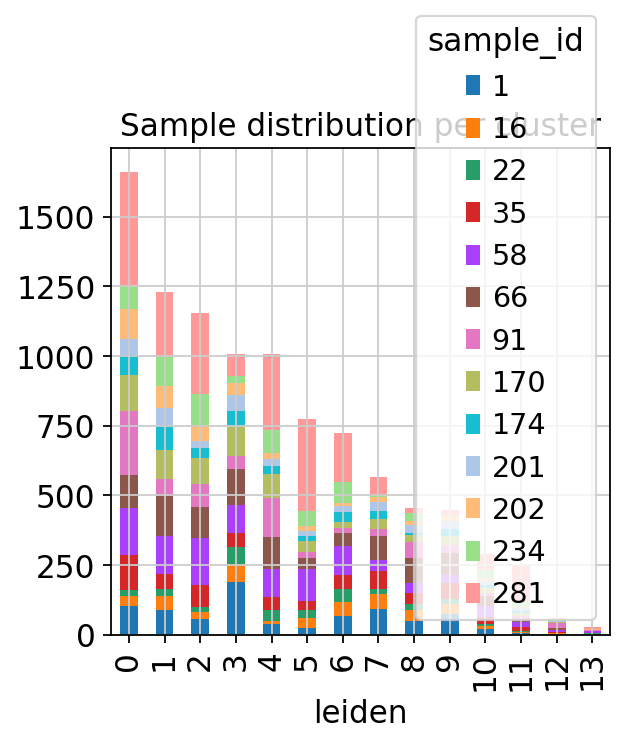

In [34]:
test = subadata.obs.groupby(['leiden','sample_id']).size().unstack(fill_value=0)
test.columns = test.columns.astype('str')
#test.insert(0, "All", test.sum(axis = 1), True)
test.T.plot.bar(stacked=True, title="1");
test.plot.bar(stacked=True, title="Sample distribution per cluster");

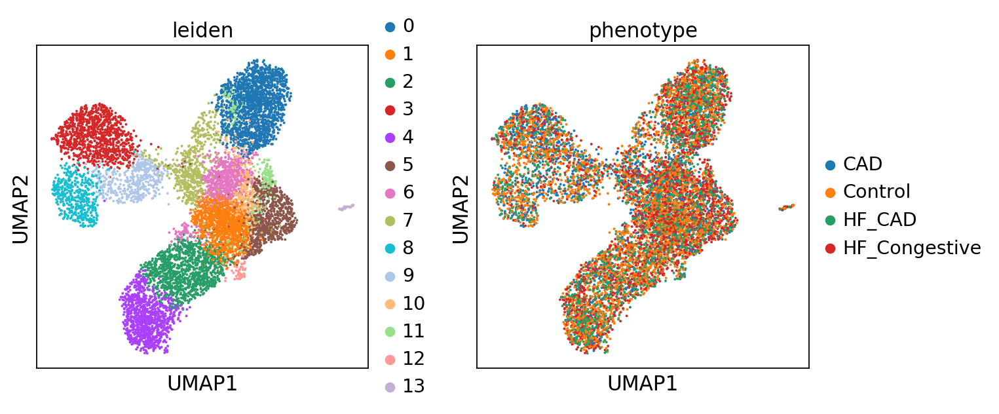

In [35]:
sc.pl.umap(subadata, color = ['leiden', 'phenotype'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:23)


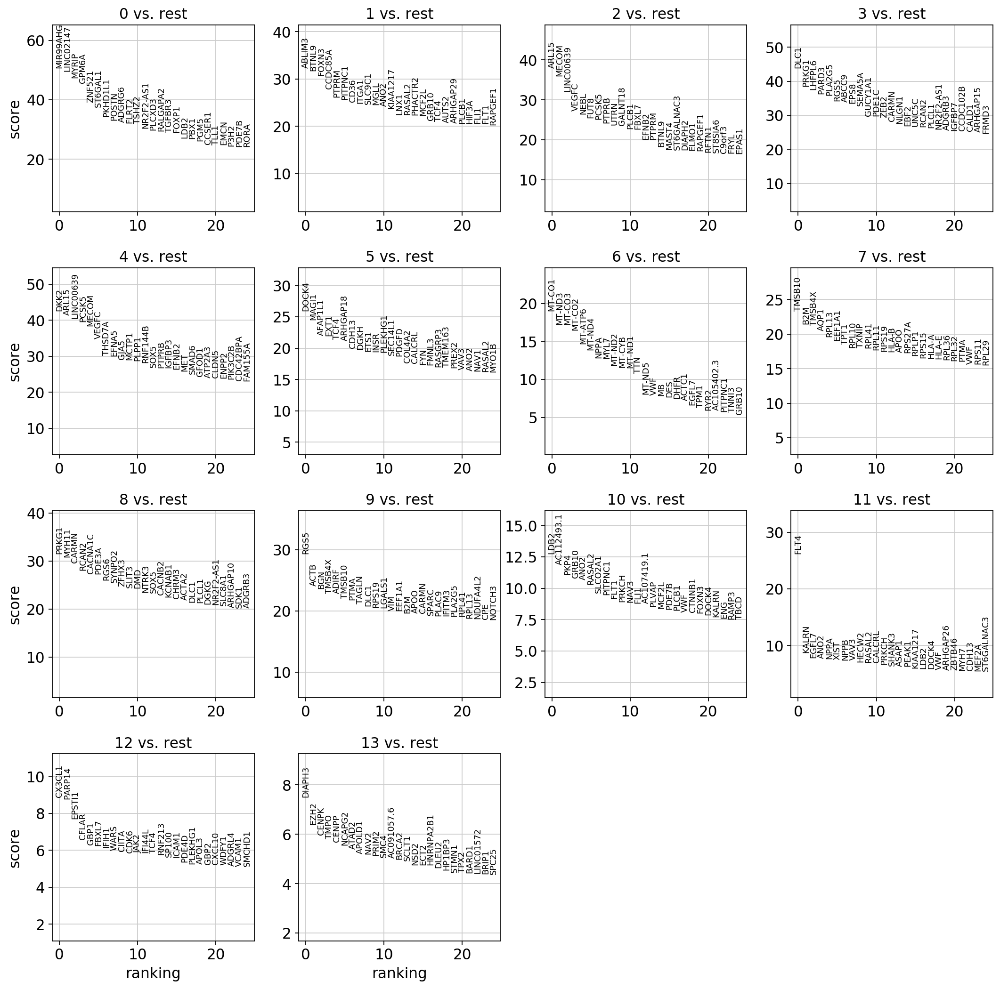

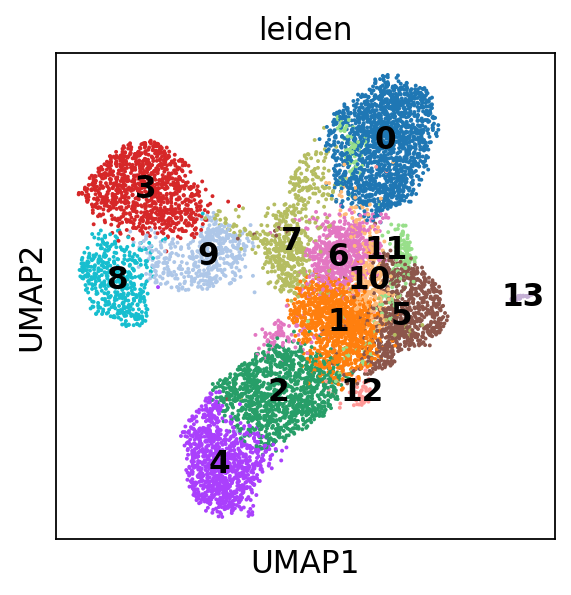

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,MIR99AHG,ABLIM3,ARL15,DLC1,DKK2,DOCK4,MT-CO1,TMSB10,PRKG1,RGS5,LDB2,FLT4,CX3CL1,DIAPH3
1,LINC02147,BTNL9,MECOM,PRKG1,ARL15,MAGI1,MT-ND3,B2M,MYH11,ACTB,AC112493.1,KALRN,PARP14,EZH2
2,MYRIP,FOXN3,LINC00639,LHFPL6,LINC00639,AFAP1L1,MT-CO3,TMSB4X,CARMN,BGN,PKP4,EGFL7,EPSTI1,CENPK
3,GPM6A,CCDC85A,VEGFC,PARD3,PCSK5,EXT1,MT-CO2,AQP1,RCAN2,TMSB4X,GRB10,ANO2,CFLAR,TMPO
4,ZNF521,PTPRM,NEBL,PLA2G5,MECOM,TCF4,MT-ATP6,RPL13,CACNA1C,ADIRF,ANO2,NPPA,GBP1,CENPP
5,ST6GAL1,PITPNC1,FUT8,RGS5,VEGFC,ARHGAP18,MT-ND4,EEF1A1,PDE3A,TMSB10,RASAL2,XIST,FBXL7,NCAPG2
6,PKHD1L1,CD36,PCSK5,ABCC9,THSD7A,CDH13,NPPA,TPT1,RGS6,PTMA,SLCO2A1,NPPB,IFIH1,ATAD2
7,POSTN,ITGA1,PTPRB,EPS8,EFNA5,DGKH,MYL7,RPL10,SYNPO2,TAGLN,PITPNC1,VAV3,WARS,APOLD1
8,ADGRG6,SLC9C1,UTRN,SEMA5A,GJA5,ETS1,MT-ND2,TXNIP,ZFHX3,DLC1,FLT1,HECW2,CIITA,NAV2
9,FLRT2,MGLL,GALNT18,GUCY1A1,MCTP1,INSR,MT-CYB,RPL41,SLIT3,RPS19,PRKCH,RASAL2,CDK6,PRIM2


In [37]:
sc.tl.rank_genes_groups(subadata, 'leiden', method='wilcoxon', n_genes = 1000)
sc.pl.rank_genes_groups(subadata, n_genes=25, sharey=False)

sc.pl.umap(subadata, color = 'leiden', legend_loc = 'on data')

pd.DataFrame(subadata.uns['rank_genes_groups']['names']).head(25)

running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: VC_EC, AC_EC, C_EC, etc.


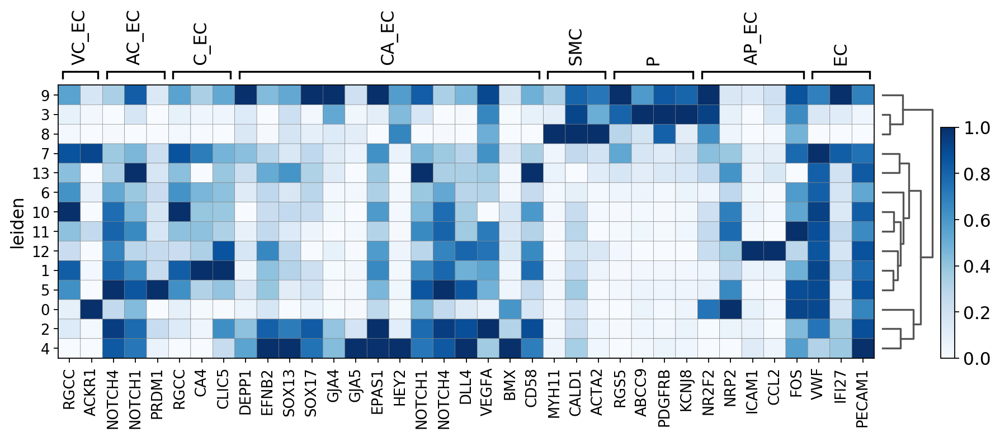

categories: 0, 1, 2, etc.
var_group_labels: VC_EC, AC_EC, C_EC, etc.


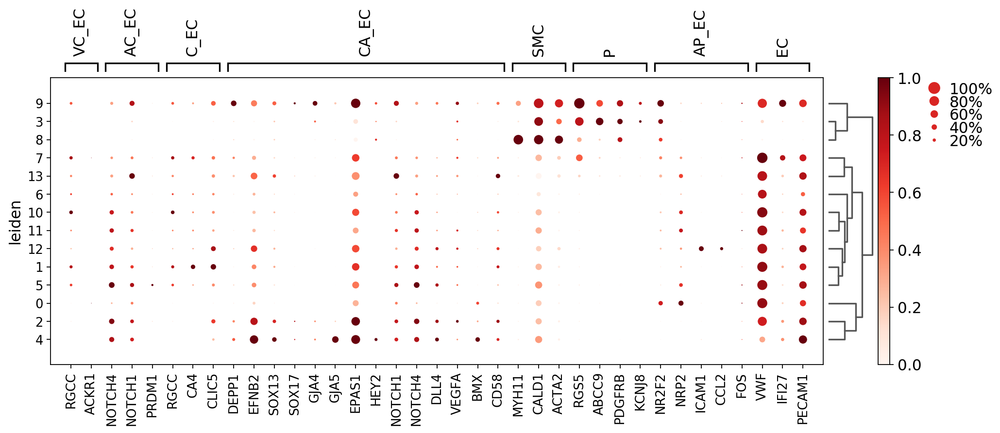

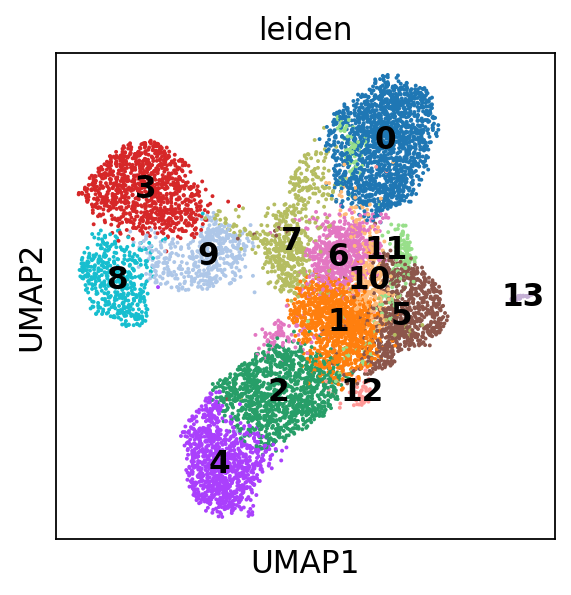

In [38]:
sc.tl.leiden(subadata, resolution = 1)
#sc.pl.umap(adata, color= 'leiden')
#sc.pl.matrixplot(adata, var_names = ['VWF', 'PECAM1'], groupby = 'leiden', use_raw = True)
markers_all = ['RGCC', 'ACKR1', 
               'NOTCH4', 'NOTCH1', 'PRDM1',
               'RGCC', 'CA4', 'CLIC5',
               "DEPP1", "EFNB2", "SOX13", "SOX17", "GJA4", "GJA5", "EPAS1", "HEY2", "NOTCH1"
                         ,"NOTCH4", "DLL4", "VEGFA", "BMX", "CD58",
               "MYH11", "CALD1", "ACTA2", 
               "RGS5", "ABCC9", "PDGFRB", "KCNJ8",
               'NR2F2', 'NRP2', 'ICAM1', 'CCL2', 'FOS',
              "VWF", "IFI27", "PECAM1"]
markers_groups = [(0,1), (2,4), (5,7), (8,21), (22,24), (25,28), (29, 33), (34, 36)]
markers_groups_names = ["VC_EC", "AC_EC", "C_EC", "CA_EC", "SMC", "P", 'AP_EC', 'EC']
sc.tl.dendrogram(subadata, 'leiden')
#sc.pl.matrixplot(adata, markers_all, groupby = "batch")
sc.pl.matrixplot(subadata, var_names = markers_all, groupby = "leiden", use_raw = True, 
               standard_scale = "var", var_group_positions = markers_groups, 
                var_group_labels = markers_groups_names,
               cmap = "Blues", save="heatmap.png", dendrogram = True)
sc.pl.dotplot(subadata, var_names = markers_all, groupby = "leiden", use_raw = True, 
               standard_scale = "var", var_group_positions = markers_groups, 
                var_group_labels = markers_groups_names,
               save="heatmap.png", dendrogram = True)
sc.pl.umap(subadata, color = 'leiden', legend_loc = 'on data')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: AC_EC, PVC_EC, CA_EC, etc.


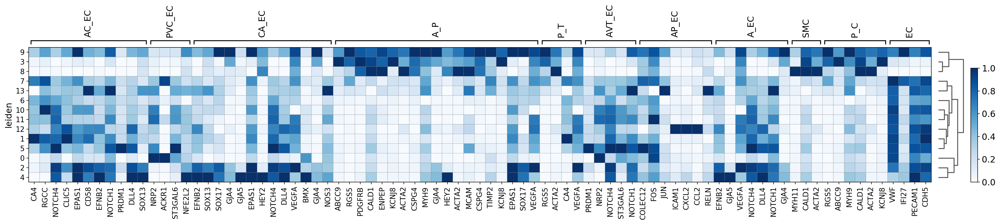

categories: 0, 1, 2, etc.
var_group_labels: AC_EC, PVC_EC, CA_EC, etc.


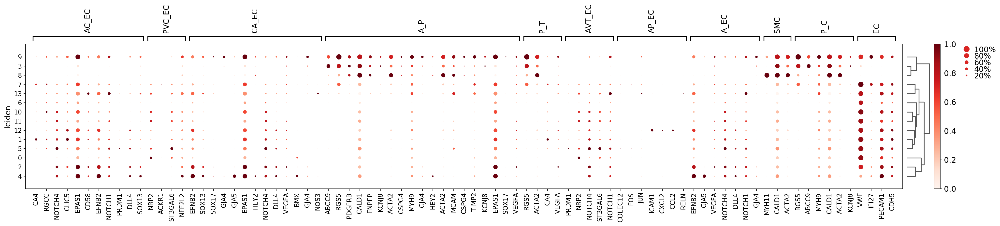

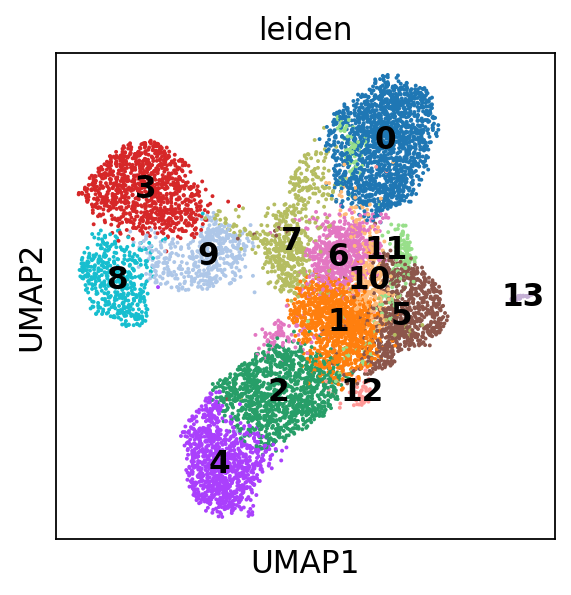

In [39]:
#sc.tl.leiden(subadata, resolution = 1)
markers_all = ['CA4', 'RGCC', 'NOTCH4', 'CLIC5', 'EPAS1', 'CD58', 'EFNB2', 'NOTCH1', 'PRDM1', "DLL4", "SOX13",
               'NRP2', 'ACKR1', 'ST3GAL6', 'NFE2L2',
               "EFNB2", "SOX13", "SOX17", "GJA4", "GJA5", "EPAS1", "HEY2"
                         ,"NOTCH4", "DLL4", "VEGFA", "BMX", "GJA4", "NOS3",
               "ABCC9", "RGS5", "PDGFRB", "CALD1", "ENPEP", "KCNJ8", "ACTA2", "CSPG4", "MYH9", "GJA4", "HEY2", 
                   "ACTA2", "MCAM", "CSPG4", "TIMP2", "KCNJ8", "EPAS1", "SOX17", "VEGFA",
               "RGS5", "ACTA2", "CA4", "VEGFA",
               "PRDM1", "NRP2", "NOTCH4", "ST3GAL6", "NOTCH1",
               "COLEC12", "FOS", "JUN", "ICAM1", "CXCL2", "CCL2", "RELN",
               "EFNB2", "GJA5", "VEGFA", "NOTCH4", "DLL4", "NOTCH1", "GJA4",
               "MYH11", "CALD1", "ACTA2",
                "RGS5", "ABCC9", "MYH9", "CALD1", "ACTA2", "KCNJ8",
              "VWF", "IFI27", "PECAM1", "CDH5"]
markers_groups = [(0,10), (11,14), (15,27), (28,46), (47,50), (51,55), 
                  (56, 62), (63, 69), (70, 72), (73, 78), (79,82)]
markers_groups_names = ["AC_EC", "PVC_EC", "CA_EC", "A_P", "P_T", "AVT_EC", "AP_EC", "A_EC", "SMC", "P_C", 'EC']
#new_cell_type_names = ["Arterial Capillary EC (AP_EC)", "Post-capillary Venous EC (PCV_EC)", 
#                        "Coronary Artery EC (CA_EC)", "Arterial Pericyte (A_P)", 
#                            "Pericyte (Transitionnal), (P_T)", "A/V Transitionnal EC (AVT_EC)",
#                        "Antigen Presenting EC (AP_EC)", "Arterial (arteriole) EC (A_EC)", "Smooth Muscle Cell (SMC)",
#                      "Pericyte Capillary (P_C)", "Other EC (EC)"]
#subadata.rename_categories('subtype', new_cell_type_names)
sc.tl.dendrogram(subadata, groupby='leiden')
sc.pl.matrixplot(subadata, markers_all, groupby = "leiden", use_raw = True, 
                 standard_scale = "var", var_group_positions = markers_groups, 
                 var_group_labels = markers_groups_names,
                 cmap = "Blues", save="heatmap.png", dendrogram = True)
sc.pl.dotplot(subadata, markers_all, groupby = "leiden", use_raw = True, 
                 standard_scale = "var", var_group_positions = markers_groups, 
                 var_group_labels = markers_groups_names,
                 save="heatmap.png", dendrogram = True)
sc.pl.umap(subadata, color = 'leiden', legend_loc = 'on data')

artery


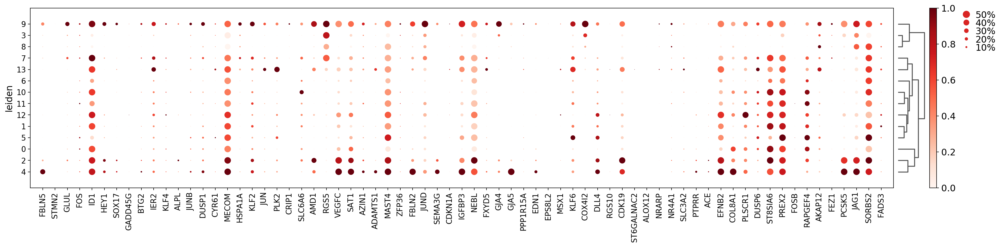

capillary arterial


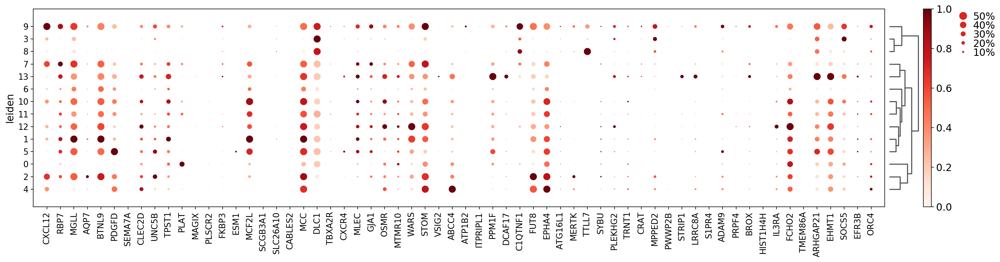

capillary


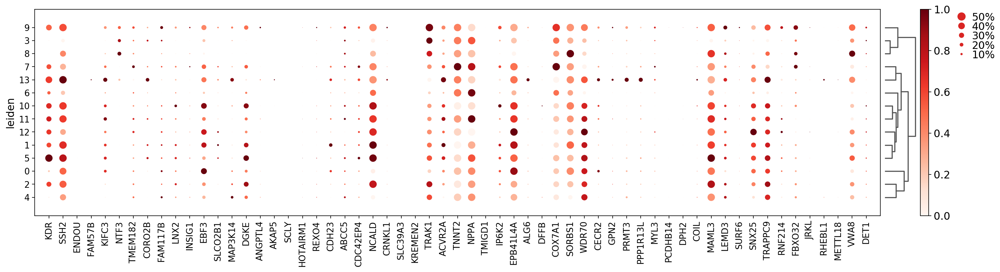

capillary venous


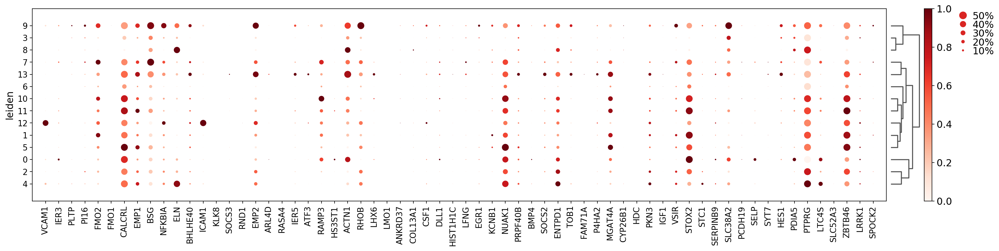

large vein


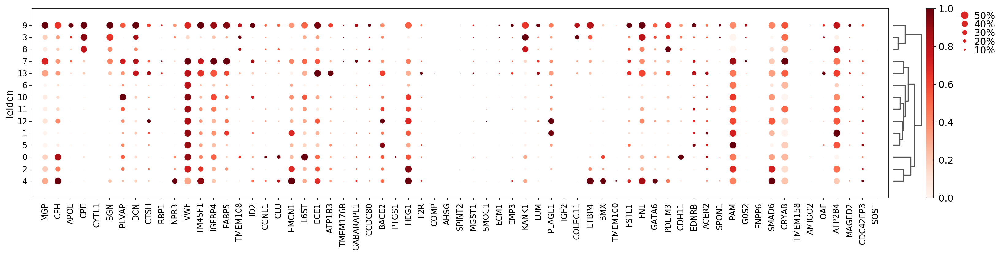

interferon


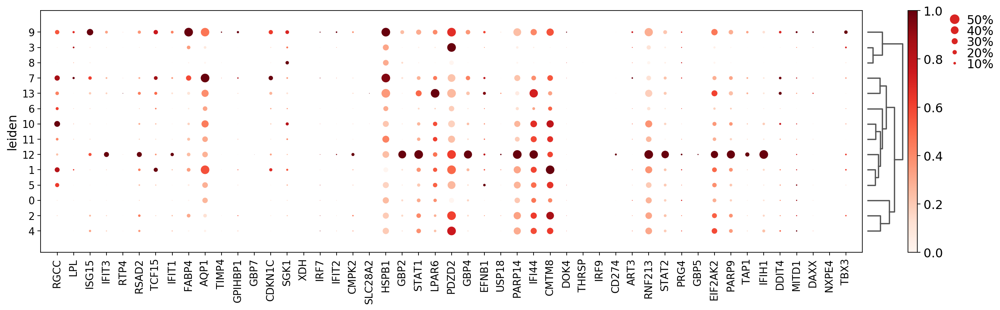

angiogenic


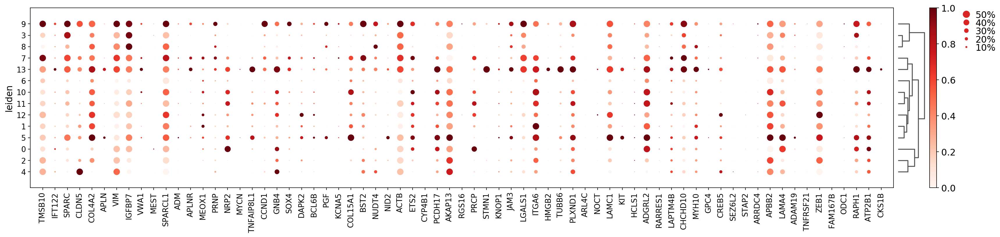

lymphatic


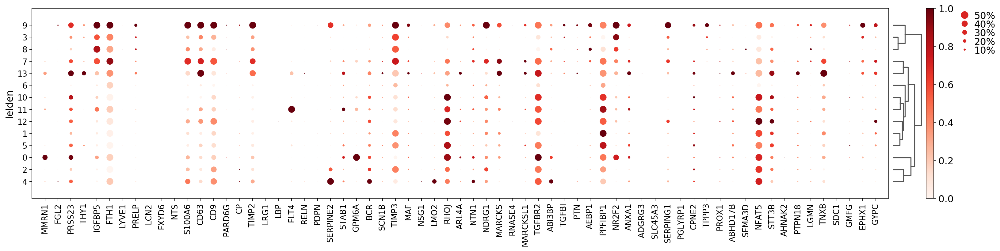

In [40]:
markers = pd.read_csv("../markers/EC_from_paper.csv").iloc[0:70, ]
del markers['Rank']

markers_dict = {}
for group in markers.columns:
    markers_dict[group] = [x.upper() for x in markers[group] if (x.upper() in list(adata.raw.var.index))]

for group in markers_dict:
    print(group)
    sc.pl.dotplot(subadata, markers_dict[group], 
              groupby = 'leiden', dot_max=0.5, dendrogram = True, standard_scale = 'var')

In [41]:
subadata.obs['tentative_subtypes'] = subadata.obs['leiden'].astype(int).replace({0: 'Post-venous capillary',
   1: 'Capillary', 2:'Arteriole', 3:'PER',
   4:'Coronary artery', 5:'Arterio venous transitionning', 6: 'TBD1 (Bad quality ?)', 7: 'TBD2 (Bad quality ?)',
    8: "SMC", 9: "TBD3 (Transitionning PER ?)", 10: "TBD4 (Capillary ?)", 11: "TBD5 (Lymphatic ?)", 
    12:"Antigen presenting", 13: "Dividing EC"})

... storing 'tentative_subtypes' as categorical


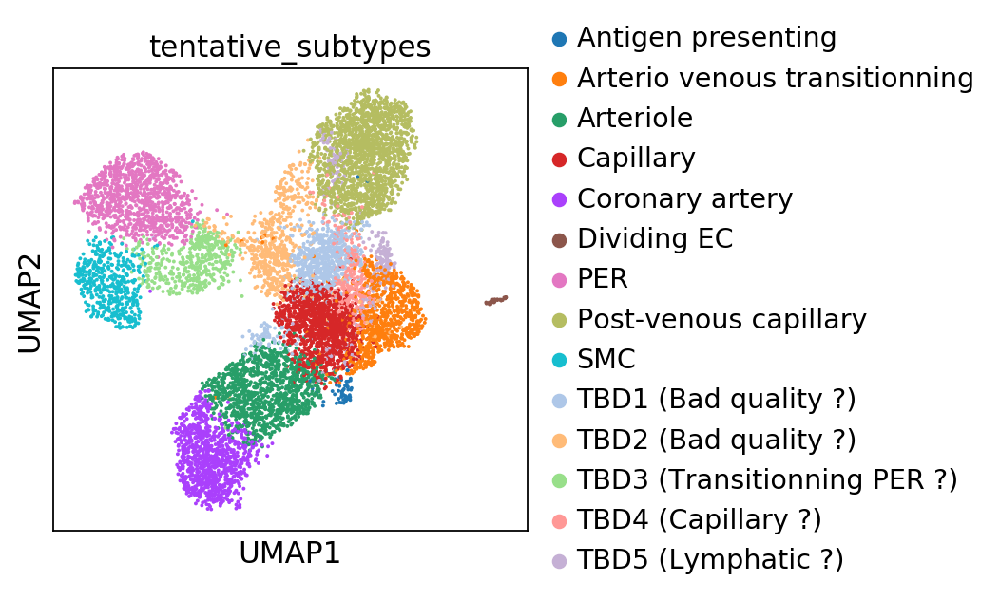

In [42]:
sc.pl.umap(subadata, color = ['tentative_subtypes'])

In [ ]:
sc.tl.rank_genes_groups(subadata, 'tentative_subtypes', method='wilcoxon', n_genes = 1000)
sc.pl.rank_genes_groups(subadata, n_genes=25, sharey=False)

sc.pl.umap(subadata, color = 'tentative_subtypes', legend_loc = 'on data')

pd.DataFrame(subadata.uns['rank_genes_groups']['names']).head(25)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:27)


In [ ]:
sc.settings.figdir = '../figures/ec_subtypes/'
for cell_type in set(subadata.obs.tentative_subtypes):
    print(cell_type)
    sc.pl.rank_genes_groups_stacked_violin(subadata, groupby = 'tentative_subtypes', n_genes=100, swap_axes = True,
                                           groups = [cell_type], save = 'EC_' + cell_type + '_markers.png')

In [ ]:
pd.DataFrame(subadata.uns['rank_genes_groups']['names']).head(200).to_csv("../EC_markers.csv")

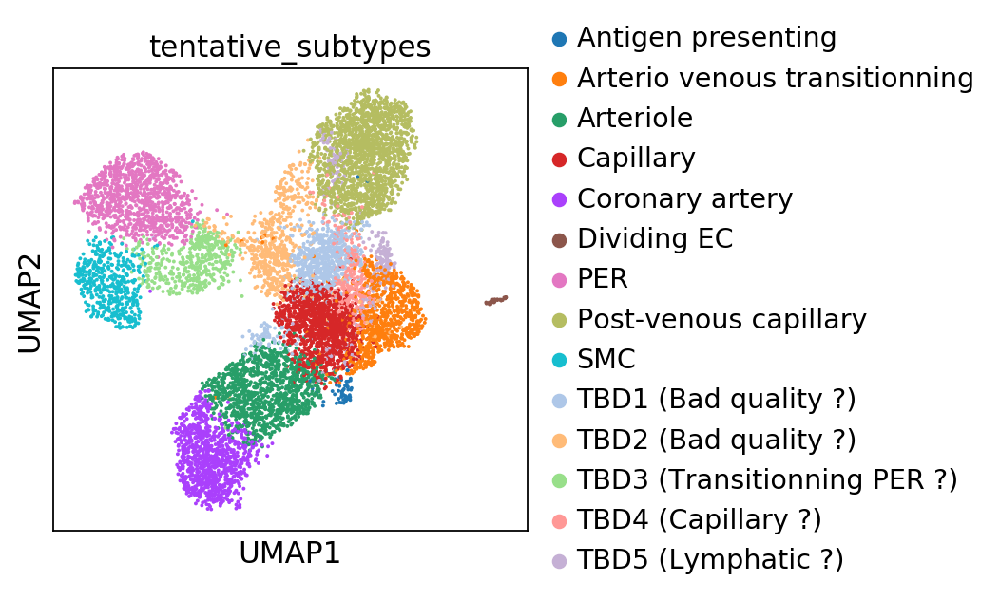

In [50]:
sc.pl.umap(subadata, color = 'tentative_subtypes')

In [51]:
subadata.write_h5ad('../h5ad/subadata_EC.h5ad')